<a href="https://colab.research.google.com/github/hruday-tej/Super-Resolution-GAN/blob/master/FaxImages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras==2.0.6
!pip install tensorflow==1.15.0

     |████████████████████████████████| 228 kB 3.8 MB/s 
     |████████████████████████████████| 2.8 MB 45.1 MB/s 
  Created wheel for keras: filename=Keras-2.0.6-py3-none-any.whl size=266419 sha256=a2f97a9e2a04ab6961cff45555156a5b79b4535a463943370bd5d8dfccf7c2c6
  Stored in directory: /root/.cache/pip/wheels/9e/9a/ac/9d48fe17244b8fd9c8fc4af4e0cf186a405d7f823488bd9e8d
  Created wheel for theano: filename=Theano-1.0.5-py3-none-any.whl size=2668111 sha256=ef3602833a0cb0e200ffd0e86116449fe4af7ce50f448e4959abc8f5a4b5ba14
  Stored in directory: /root/.cache/pip/wheels/26/68/6f/745330367ce7822fe0cd863712858151f5723a0a5e322cc144
Successfully built keras theano
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.

In [ ]:
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from tensorflow import keras

import glob
import os

from keras import Input
from keras.applications.vgg19 import VGG19
from keras.callbacks import TensorBoard
from keras.layers import BatchNormalization, Activation, LeakyReLU, Add, Dense
from keras.layers import Conv2D, UpSampling2D
from keras.models import Model
from keras.optimizers import Adam


import numpy as np

import random
from numpy import asarray
from itertools import repeat

import imageio
from imageio import imread
from PIL import Image
from skimage.transform import resize as imresize
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import skimage.io

print("Tensorflow version " + tf.__version__)
print("Keras version " + tf.keras.__version__)

Using TensorFlow backend.


Tensorflow version 1.15.0
Keras version 2.2.4-tf


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

TRAIN_PATH = r'/content/drive/MyDrive/Name_Subset/Latin_Text/'
data_path = TRAIN_PATH
image_list = []
image_list.extend(sorted(glob.glob(data_path +  '/*')))


In [ ]:
img = cv2.imread(image_list[4])

img.shape

(59, 626, 3)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
TRAIN_PATH = r'/content/drive/MyDrive/Name_Subset/Latin_Text/'
data_path = TRAIN_PATH


epochs = 1001
batch_size = 8

# define the shape of low resolution image (LR) 
low_resolution_shape = (64, 64, 3)

# define the shape of high resolution image (HR) 
high_resolution_shape = (256, 256, 3)

# optimizer for discriminator, generator 
common_optimizer = Adam(0.0002, 0.5)

In [ ]:
def get_train_images(data_path):
    image_list = []
    image_list.extend(sorted(glob.glob(data_path +  '/*')))    
    return image_list 
    
image_list = get_train_images(data_path)

In [ ]:
def sample_images(image_list, batch_size, high_resolution_shape, low_resolution_shape):
    
    """
    Pre-process a batch of training images
    """
    
    # image_list is the list of all images
    # ransom sample a batch of images
    images_batch = np.random.choice(image_list, size=batch_size)
    
    lr_images = []
    hr_images = []
    

    for img in images_batch:
  
        img1 = cv2.imread(img)
        #img1 = imread(img, pilmode='RGB')
        img1 = img1.astype(np.float32)
        
        # change the size     
        img1_high_resolution = imresize(img1, high_resolution_shape)
        img1_low_resolution = imresize(img1, low_resolution_shape)
                

        # do a random horizontal flip
        if np.random.random() < 0.5:
            img1_high_resolution = np.fliplr(img1_high_resolution)
            img1_low_resolution = np.fliplr(img1_low_resolution)
       
        hr_images.append(img1_high_resolution)
        lr_images.append(img1_low_resolution)
        
   
    # convert lists into numpy ndarrays
    return np.array(hr_images), np.array(lr_images)

In [ ]:
def save_images(original_image, lr_image, sr_image, path):
    
    """
    Save LR, HR (original) and generated SR
    images in one panel 
    """
    
    fig, ax = plt.subplots(1,2, figsize=(15, 10))

    images = [lr_image, sr_image]
    titles = ['LR','SR - generated']

    for idx,img in enumerate(images):
        # (X + 1)/2 to scale back from [-1,1] to [0,1]
        ax[idx].imshow((img + 1)/2.0, cmap='gray')
        ax[idx].axis("off")
    for idx, title in enumerate(titles):    
        ax[idx].set_title('{}'.format(title))
        
    plt.savefig(path)    

In [ ]:
def residual_block(x):

    filters = [64, 64]
    kernel_size = 3
    strides = 1
    padding = "same"
    momentum = 0.8
    activation = "relu"

    res = Conv2D(filters=filters[0], kernel_size=kernel_size, strides=strides, padding=padding)(x)
    res = Activation(activation=activation)(res)
    res = BatchNormalization(momentum=momentum)(res)

    res = Conv2D(filters=filters[1], kernel_size=kernel_size, strides=strides, padding=padding)(res)
    res = BatchNormalization(momentum=momentum)(res)

    res = Add()([res, x])
    
    return res

In [ ]:
def build_generator():
    
    # use 16 residual blocks in generator
    residual_blocks = 16
    momentum = 0.8
    
    # input LR dimension: 4x downsample of HR
    input_shape = (None, None, 3)
    
    # input for the generator
    input_layer = Input(shape=input_shape)
    
    # pre-residual block: conv layer before residual blocks 
    gen1 = Conv2D(filters=64, kernel_size=9, strides=1, padding='same', activation='relu')(input_layer)
    
    # add 16 residual blocks
    res = residual_block(gen1)
    for i in range(residual_blocks - 1):
        res = residual_block(res)
    
    # post-residual block: conv and batch-norm layer after residual blocks
    gen2 = Conv2D(filters=64, kernel_size=3, strides=1, padding='same')(res)
    gen2 = BatchNormalization(momentum=momentum)(gen2)
    
    # take the sum of pre-residual block(gen1) and post-residual block(gen2)
    gen3 = Add()([gen2, gen1])
    
    # upsampling
    gen4 = UpSampling2D(size=2)(gen3)
    gen4 = Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(gen4)
    gen4 = Activation('relu')(gen4)
    
    # upsampling
    gen5 = UpSampling2D(size=2)(gen4)
    gen5 = Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(gen5)
    gen5 = Activation('relu')(gen5)
    
    # conv layer at the output
    gen6 = Conv2D(filters=3, kernel_size=9, strides=1, padding='same')(gen5)
    output = Activation('tanh')(gen6)
    
    # model 
    model = Model(inputs=[input_layer], outputs=[output], name='generator')

    return model

In [ ]:
generator = build_generator()

In [ ]:
def build_discriminator():
    
    # define hyperparameters
    leakyrelu_alpha = 0.2
    momentum = 0.8
    
    # the input is the HR shape
    input_shape = (None, None, 3)
    
    # input layer for discriminator
    # It fixes the “dying ReLU” problem, as it doesn't have zero-slope parts.
    input_layer = Input(shape=input_shape)
    
    # 8 convolutional layers with batch normalization  
    dis1 = Conv2D(filters=64, kernel_size=3, strides=1, padding='same')(input_layer)
    dis1 = LeakyReLU(alpha=leakyrelu_alpha)(dis1)

    dis2 = Conv2D(filters=64, kernel_size=3, strides=2, padding='same')(dis1)
    dis2 = LeakyReLU(alpha=leakyrelu_alpha)(dis2)
    dis2 = BatchNormalization(momentum=momentum)(dis2)

    dis3 = Conv2D(filters=128, kernel_size=3, strides=1, padding='same')(dis2)
    dis3 = LeakyReLU(alpha=leakyrelu_alpha)(dis3)
    dis3 = BatchNormalization(momentum=momentum)(dis3)

    dis4 = Conv2D(filters=128, kernel_size=3, strides=2, padding='same')(dis3)
    dis4 = LeakyReLU(alpha=leakyrelu_alpha)(dis4)
    dis4 = BatchNormalization(momentum=0.8)(dis4)

    dis5 = Conv2D(256, kernel_size=3, strides=1, padding='same')(dis4)
    dis5 = LeakyReLU(alpha=leakyrelu_alpha)(dis5)
    dis5 = BatchNormalization(momentum=momentum)(dis5)

    dis6 = Conv2D(filters=256, kernel_size=3, strides=2, padding='same')(dis5)
    dis6 = LeakyReLU(alpha=leakyrelu_alpha)(dis6)
    dis6 = BatchNormalization(momentum=momentum)(dis6)

    dis7 = Conv2D(filters=512, kernel_size=3, strides=1, padding='same')(dis6)
    dis7 = LeakyReLU(alpha=leakyrelu_alpha)(dis7)
    dis7 = BatchNormalization(momentum=momentum)(dis7)

    dis8 = Conv2D(filters=512, kernel_size=3, strides=2, padding='same')(dis7)
    dis8 = LeakyReLU(alpha=leakyrelu_alpha)(dis8)
    dis8 = BatchNormalization(momentum=momentum)(dis8)
    
    # fully connected layer 
    dis9 = Dense(units=1024)(dis8)
    dis9 = LeakyReLU(alpha=0.2)(dis9)
    
    # last fully connected layer - for classification 
    output = Dense(units=1, activation='sigmoid')(dis9)   
    
    model = Model(inputs=[input_layer], outputs=[output], name='discriminator')
    
    return model

In [ ]:
discriminator = build_discriminator()
discriminator.trainable = True
discriminator.compile(loss='mse', optimizer=common_optimizer, metrics=['accuracy'])

In [ ]:
VGG19_base = VGG19(weights="imagenet")


Instructions for updating:
keep_dims is deprecated, use keepdims instead
574709760/574710816 [============================>.] - ETA: 0sWARNING:tensorflow:From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:154: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.







In [ ]:
def build_VGG19():
    
    input_shape = (256, 256, 3)
    VGG19_base.outputs = [VGG19_base.get_layer('block5_conv2').output]
    input_layer = Input(shape=input_shape)
    features = VGG19_base(input_layer)
    model = Model(inputs=[input_layer], outputs=[features])
    
    return model

fe_model = build_VGG19()
fe_model.trainable = False
fe_model.compile(loss='mse', optimizer=common_optimizer, metrics=['accuracy'])

In [ ]:
def build_adversarial_model(generator, discriminator, feature_extractor):
    
    # input layer for high-resolution images
    input_high_resolution = Input(shape=high_resolution_shape)

    # input layer for low-resolution images
    input_low_resolution = Input(shape=low_resolution_shape)

    # generate high-resolution images from low-resolution images
    generated_high_resolution_images = generator(input_low_resolution)

    # extract feature maps from generated images
    features = feature_extractor(generated_high_resolution_images)

    # discriminator will give us a probability estimation for the generated high-resolution images
    probs = discriminator(generated_high_resolution_images)

    # create and compile 
    adversarial_model = Model([input_low_resolution, input_high_resolution], [probs, features])
    adversarial_model.compile(loss=['binary_crossentropy', 'mse'], loss_weights=[1e-3, 1], optimizer=common_optimizer)
    
    return adversarial_model

In [ ]:
adversarial_model = build_adversarial_model(generator, discriminator, fe_model)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


0

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor

Epoch: [1/999] 
1
Epoch: [2/999] 
2
Epoch: [3/999] 
3
Epoch: [4/999] 
4
Epoch: [5/999] 
5
Epoch: [6/999] 
6
Epoch: [7/999] 
7
Epoch: [8/999] 
8
Epoch: [9/999] 
9
Epoch: [10/999] 
10
Epoch: [11/999] 
11
Epoch: [12/999] 
12
Epoch: [13/999] 
13
Epoch: [14/999] 
14
Epoch: [15/999] 
15
Epoch: [16/999] 
16
Epoch: [17/999] 
17
Epoch: [18/999] 
18
Epoch: [19/999] 
19
Epoch: [20/999] 
20
Epoch: [21/999] 
21
Epoch: [22/999] 
22
Epoch: [23/999] 
23
Epoch: [24/999] 
24
Epoch: [25/999] 
25
Epoch: [26/999] 
26
Epoch: [27/999] 
27
Epoch: [28/999] 
28
Epoch: [29/999] 
29
Epoch: [30/999] 
30
Epoch: [31/999] 
31
Epoch: [32/999] 
32
Epoch: [33/999] 
33
Epoch: [34/999] 
34
Epoch: [35/999] 
35
Epoch: [36/999] 
36
Epoch: [37/999] 
37
Epoch: [38/999] 
38
Epoch: [39/999] 
39
Epoch: [40/999] 
40
Epoch: [41/999] 
41
Epoch: [42/999] 
42
Epoch: [43/999] 
43
Epoch: [44/999] 
44
Epoch: [45/999] 

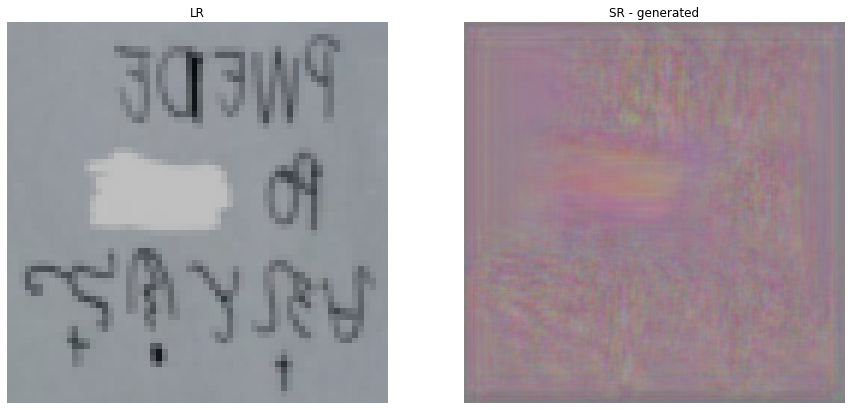

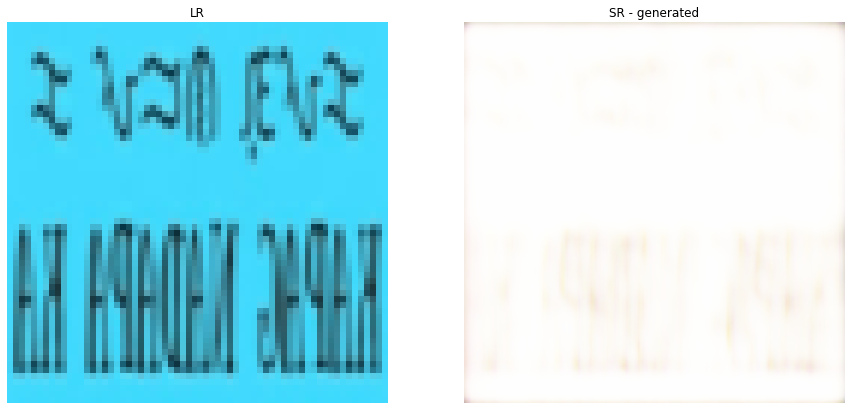

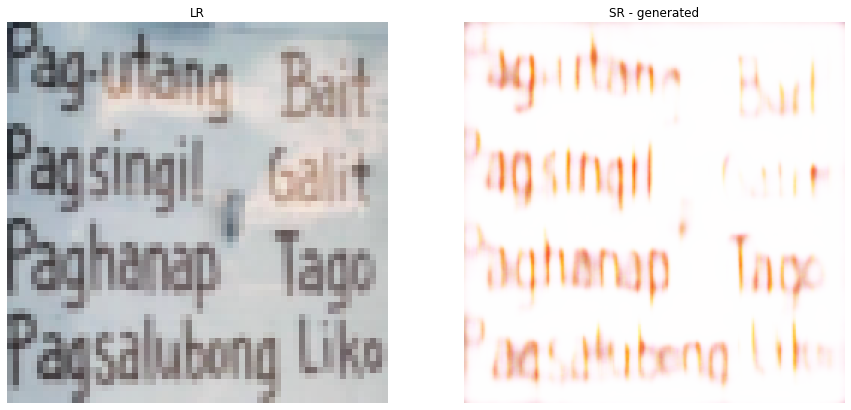

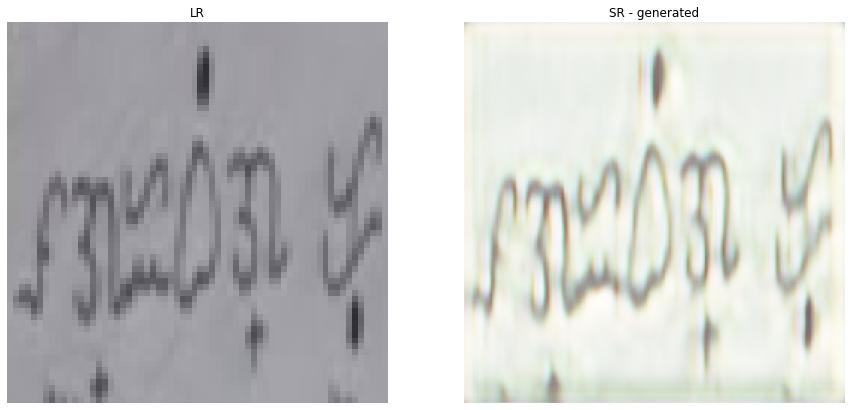

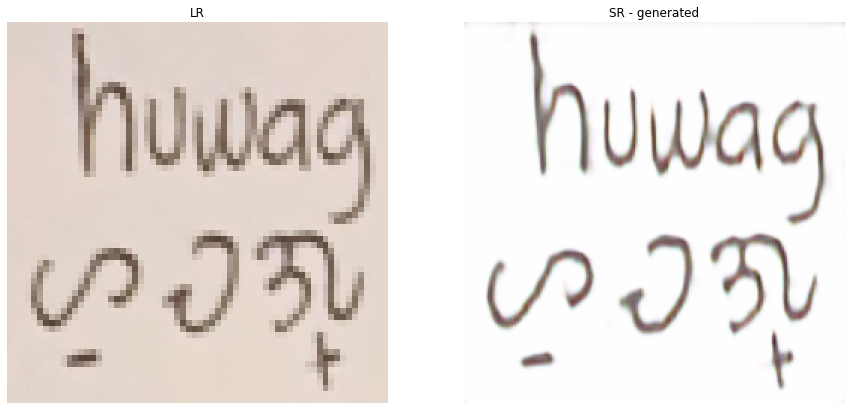

...

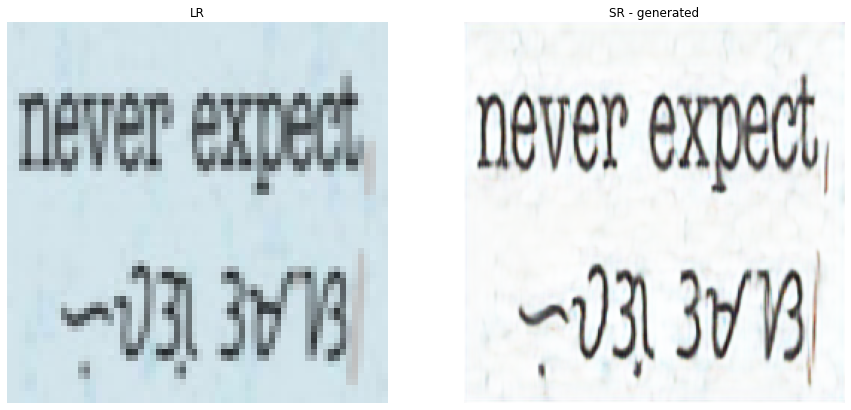

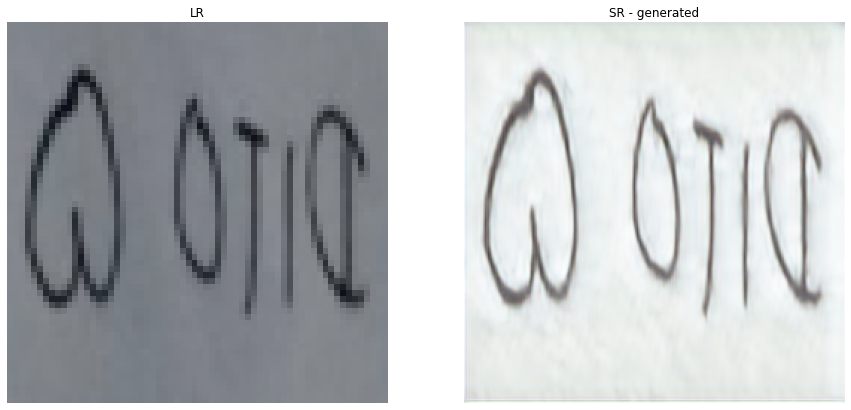

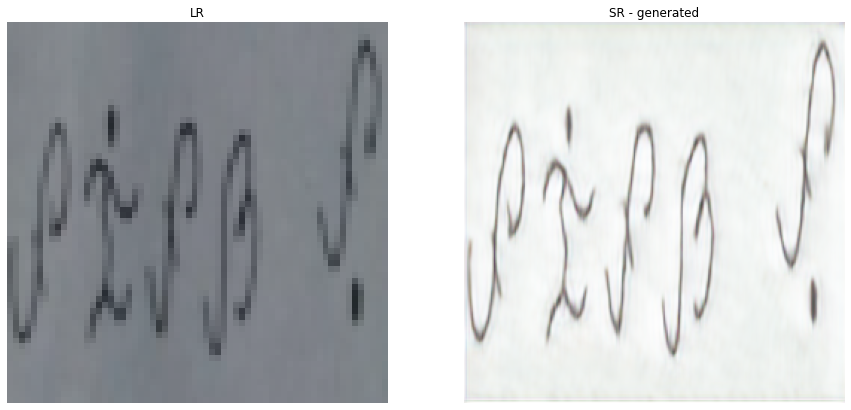

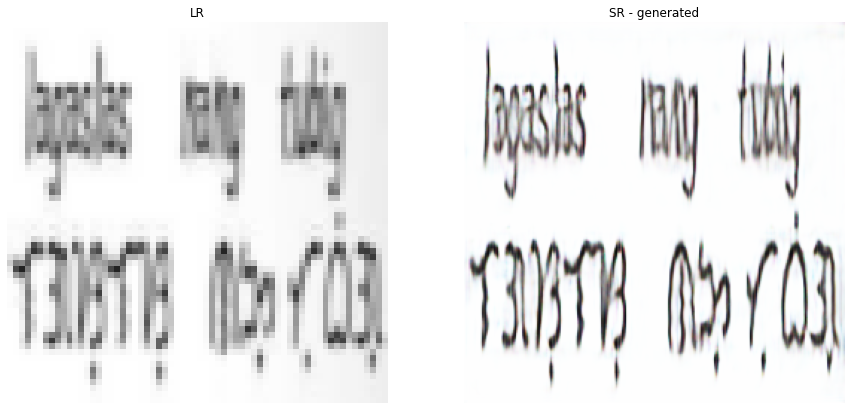

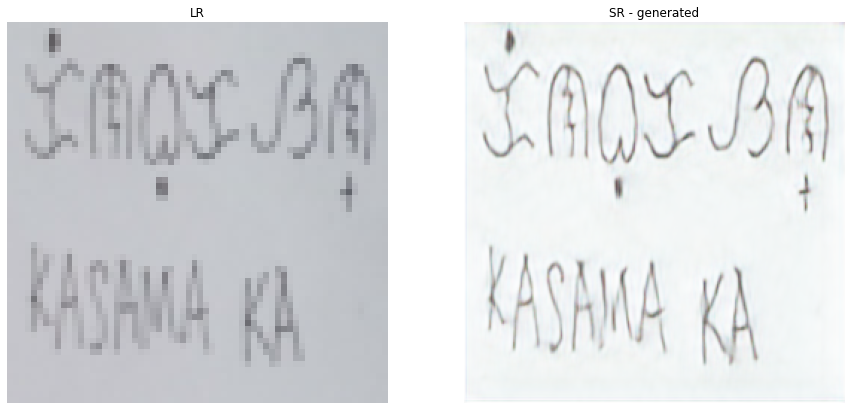

In [ ]:
epochs = 1000
for epoch in range(epochs):

    image_list = get_train_images(data_path)
    
    """
    Train the discriminator network
    """
    print(epoch)
    
    hr_images, lr_images = sample_images(image_list, 
                                         batch_size=batch_size,
                                         low_resolution_shape=low_resolution_shape,
                                         high_resolution_shape=high_resolution_shape)
    
    
    # normalize the images
    hr_images = hr_images / 127.5 - 1.
    lr_images = lr_images / 127.5 - 1.
    
    # generate high-resolution images from low-resolution images
    generated_high_resolution_images = generator.predict(lr_images)
    
    # generate a batch of true and fake labels 
    real_labels = np.ones((batch_size, 16, 16, 1))
    fake_labels = np.zeros((batch_size, 16, 16, 1))
    
 
    d_loss_real = discriminator.train_on_batch(hr_images, real_labels)
    d_loss_real =  np.mean(d_loss_real)
    d_loss_fake = discriminator.train_on_batch(generated_high_resolution_images, fake_labels)
    d_loss_fake =  np.mean(d_loss_fake)
    
    # calculate total loss of discriminator as average loss on true and fake labels
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
   

    """
        Train the generator network
    """
      
    # sample a batch of images    
    hr_images, lr_images = sample_images(image_list, 
                                         batch_size=batch_size,
                                         low_resolution_shape=low_resolution_shape,
                                         high_resolution_shape=high_resolution_shape)
    
    
    # normalize the images
    hr_images = hr_images / 127.5 - 1.
    lr_images = lr_images / 127.5 - 1.
    
    
    
    # extract feature maps for true high-resolution images
    image_features = fe_model.predict(hr_images)


    
    # train the generator
    g_loss = adversarial_model.train_on_batch([lr_images, hr_images],
                                               [real_labels, image_features])

    
    print("Epoch: [{}/{}] ".format(epoch+1,epochs-1 ))
    
    if epoch % 10 == 0:
        
        hr_images, lr_images = sample_images(image_list, 
                                             batch_size=1,
                                             low_resolution_shape=low_resolution_shape,
                                             high_resolution_shape=high_resolution_shape)
    
    
        # normalize the images
        hr_images = hr_images / 127.5 - 1.
        lr_images = lr_images / 127.5 - 1.
    
    
        generated_images = generator.predict_on_batch(lr_images)
    
        for index, img in enumerate(generated_images):
            if index < 3:   # comment this line to display all the images
                save_images(hr_images[index], lr_images[index], img,
                            path="/content/drive/MyDrive/Name_Subset/progress/progress_Epoch-{}_Image-{}".format(epoch, index))

In [ ]:
from tensorflow.keras.models import model_from_json
from keras.models import load_model

# serialize model to JSON
#  the keras model which is trained is defined as 'model' in this example
model_json = generator.to_json()

with open("/content/Latin_1000_Generator.json", "w") as json_file:
    json_file.write(model_json)

# serialize weights to HDF5
generator.save_weights("/content/Latin_1000_Generator_weight.h5")

In [ ]:
generator.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_7 (InputLayer)             (None, None, None, 3) 0                                            
____________________________________________________________________________________________________
conv2d_46 (Conv2D)               (None, None, None, 64 15616       input_7[0][0]                    
____________________________________________________________________________________________________
conv2d_47 (Conv2D)               (None, None, None, 64 36928       conv2d_46[0][0]                  
____________________________________________________________________________________________________
activation_20 (Activation)       (None, None, None, 64 0           conv2d_47[0][0]                  
___________________________________________________________________________________________

In [ ]:
pip install h5py==2.10.0 --force-reinstall

     |████████████████████████████████| 2.9 MB 5.6 MB/s 
     |████████████████████████████████| 15.7 MB 34.4 MB/s 
  Attempting uninstall: six
    Found existing installation: six 1.15.0
    Uninstalling six-1.15.0:
      Successfully uninstalled six-1.15.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.5
    Uninstalling numpy-1.21.5:
      Successfully uninstalled numpy-1.21.5
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.16.0 requires gast>=0.3.2, but you have gast 0.2.2 which is incompatible.
kapre 0.3.7 requires tensorflow>=2.0.0, but you have tensorflow 1.15.0 which is incompatible.
google-colab 1.0.0 requires six~=1.15.0, but you have six 1.16.0 which is inco

In [ ]:
from tensorflow.keras.models import model_from_json
from keras.models import load_model

# load json and create model
json_file = open('/content/Number_Plates_Generator.json', 'r')

loaded_model_json = json_file.read()
json_file.close()
srgan_model = model_from_json(loaded_model_json)

# load weights into new model
srgan_model.load_weights("/content/Number_Plates_Generator_weight.h5")
print("Loaded model from disk")

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Loaded model from disk


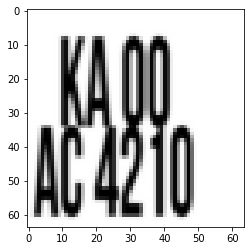

In [ ]:
img = cv2.imread('/content/sample_data/KA 00 AC 4210.png')

img2 = imresize(img,(64,64,3))
cv2.imwrite('/content/sample_data/new_img.png',img2*255)
plt.imshow(img2)

In [ ]:
path = r'/content/sample_data/test/'
# image_list = get_train_images()   
# hr_images, lr_images = sample_images(image_list, 
#                                     low_resolution_shape=low_resolution_shape,
#                                     high_resolution_shape=high_resolution_shape)
l=[]
l.append(cv2.imread('/content/sample_data/test/new_img.png'))
lr_image = np.array(l)

lr_image = lr_image / 127.5 - 1.

# generate high-resolution images from low-resolution images
generated_high_resolution_images = srgan_model.predict(lr_image)

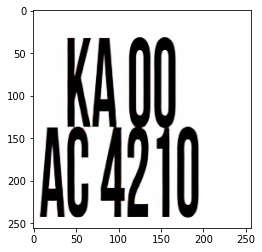

In [ ]:
result = ((generated_high_resolution_images+1)*127.5).astype(np.uint8)[0]

plt.imshow(result)